# Top-Down View of the Solar System

This notebook visualizes the solar system from above the ecliptic plane. We compute
heliocentric ecliptic positions for all eight planets and ~600k MPC-catalogued asteroids
at today's date (2026-02-15), then plot them in a top-down (x-y ecliptic) projection.

1. Compute planet positions via JPL low-precision ephemerides
2. Load MPC asteroid orbital elements and propagate to the target date using `asteroid_state_ecliptic`
3. Plot inner solar system (main belt) and full solar system views

In [1]:
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import scienceplots  # noqa: F401

from astrojax import (
    AU,
    EMB_ID,
    JUPITER_ID,
    MARS_ID,
    MERCURY_ID,
    NEPTUNE_ID,
    SATURN_ID,
    URANUS_ID,
    VENUS_ID,
    Epoch,
    planet_position_jpl_approx,
    set_dtype,
)
from astrojax.datasets import asteroid_state_ecliptic, load_mpc_asteroids
from astrojax.frames import rotation_icrf_to_ecliptic

set_dtype(jnp.float64)

plt.style.use(["science", "ieee"])

## Configuration

Target epoch and planet metadata for the visualization.

In [2]:
# Target date
TARGET_EPOCH = Epoch(2026, 2, 15)
TARGET_JD = float(TARGET_EPOCH.jd())

# Planet definitions: (id, name, color, marker_size)
PLANETS = [
    (MERCURY_ID, "Mercury", "#8c8c8c", 20),
    (VENUS_ID, "Venus", "#e6c35c", 30),
    (EMB_ID, "Earth", "#3a7ca5", 35),
    (MARS_ID, "Mars", "#c1440e", 25),
    (JUPITER_ID, "Jupiter", "#c88b3a", 50),
    (SATURN_ID, "Saturn", "#d4a017", 45),
    (URANUS_ID, "Uranus", "#73c2fb", 35),
    (NEPTUNE_ID, "Neptune", "#3f54ba", 35),
]

# Rotation matrix: equatorial (ICRF) -> ecliptic
R_eq_to_ecl = rotation_icrf_to_ecliptic()

print(f"Target epoch: {TARGET_EPOCH}")
print(f"Target JD:    {TARGET_JD:.1f}")

Target epoch: 2026-02-15T00:00:00.000Z
Target JD:    2461086.5


## Planet Positions

Compute heliocentric ecliptic positions for all eight planets. The JPL
low-precision ephemerides return equatorial (ICRF) coordinates, so we
rotate each position vector into the ecliptic frame and convert to AU.

In [3]:
planet_positions = {}  # name -> (x_au, y_au, z_au)

print(f"{'Planet':<10} {'X [AU]':>10} {'Y [AU]':>10} {'Z [AU]':>10} {'R [AU]':>10}")
print("-" * 55)

for pid, name, _color, _size in PLANETS:
    r_eq = planet_position_jpl_approx(pid, TARGET_EPOCH)  # equatorial, metres
    r_ecl = R_eq_to_ecl @ r_eq  # ecliptic, metres
    r_au = np.array(r_ecl / AU)  # convert to AU
    planet_positions[name] = (r_au[0], r_au[1], r_au[2])
    r_mag = np.sqrt(r_au[0] ** 2 + r_au[1] ** 2 + r_au[2] ** 2)
    print(f"{name:<10} {r_au[0]:>10.4f} {r_au[1]:>10.4f} {r_au[2]:>10.4f} {r_mag:>10.4f}")

Planet         X [AU]     Y [AU]     Z [AU]     R [AU]
-------------------------------------------------------
Mercury        0.2031     0.2390     0.0009     0.3137
Venus          0.7108    -0.1479    -0.0430     0.7273
Earth         -0.8183     0.5531    -0.0000     0.9876
Mars           0.9180    -1.0461    -0.0444     1.3924
Jupiter       -2.0148     4.8213     0.0250     5.2254
Saturn         9.4807     0.5202    -0.3863     9.5029
Uranus         9.7216    16.8757    -0.0634    19.4757
Neptune       29.8662     0.6560    -0.7018    29.8816


## Asteroid Positions

Load the full MPC asteroid catalog (~600k objects), extract valid orbital
elements, and propagate each asteroid to the target epoch using
`asteroid_state_ecliptic` with `jax.vmap` for vectorized computation.

In [4]:
# Load MPC data
df = load_mpc_asteroids()
print(f"Total MPC records: {df.shape[0]:,}")

# Filter to records with valid orbital elements
required_cols = ["epoch_jd", "a", "e", "i", "node", "peri", "M"]
df_valid = df.drop_nulls(subset=required_cols)
print(f"Valid records:     {df_valid.shape[0]:,}")

Total MPC records: 1,518,365
Valid records:     1,518,365


In [5]:
# Build JAX arrays from orbital elements
epoch_jd_np = df_valid["epoch_jd"].to_numpy()
a_np = df_valid["a"].to_numpy()
e_np = df_valid["e"].to_numpy()
i_np = df_valid["i"].to_numpy()
node_np = df_valid["node"].to_numpy()
peri_np = df_valid["peri"].to_numpy()
M_np = df_valid["M"].to_numpy()

# Stack into (N, 6) orbital elements: [a_AU, e, i_deg, node_deg, peri_deg, M_deg]
oe_np = np.column_stack([a_np, e_np, i_np, node_np, peri_np, M_np])

epoch_jd_jax = jnp.array(epoch_jd_np)
oe_jax = jnp.array(oe_np)
target_jd_jax = jnp.float64(TARGET_JD)

print(f"Orbital elements shape: {oe_jax.shape}")
print(f"Epoch JDs shape:        {epoch_jd_jax.shape}")

Orbital elements shape: (1518365, 6)
Epoch JDs shape:        (1518365,)


In [6]:
# Vectorized state computation in batches to avoid OOM
BATCH_SIZE = 100_000
n_total = oe_jax.shape[0]
n_batches = (n_total + BATCH_SIZE - 1) // BATCH_SIZE

vmap_fn = jax.vmap(lambda epoch, oe: asteroid_state_ecliptic(epoch, oe, target_jd_jax, use_au=True))
jit_vmap_fn = jax.jit(vmap_fn)

all_states = []
for b in range(n_batches):
    start = b * BATCH_SIZE
    end = min(start + BATCH_SIZE, n_total)
    batch_states = jit_vmap_fn(epoch_jd_jax[start:end], oe_jax[start:end])
    all_states.append(batch_states)
    print(f"  Batch {b + 1}/{n_batches}: {end - start:,} asteroids")

states = jnp.concatenate(all_states, axis=0)  # (N, 6)
ast_x = np.asarray(states[:, 0])
ast_y = np.asarray(states[:, 1])

print(f"\nComputed states for {states.shape[0]:,} asteroids")

  Batch 1/16: 100,000 asteroids
  Batch 2/16: 100,000 asteroids
  Batch 3/16: 100,000 asteroids
  Batch 4/16: 100,000 asteroids
  Batch 5/16: 100,000 asteroids
  Batch 6/16: 100,000 asteroids
  Batch 7/16: 100,000 asteroids
  Batch 8/16: 100,000 asteroids
  Batch 9/16: 100,000 asteroids
  Batch 10/16: 100,000 asteroids
  Batch 11/16: 100,000 asteroids
  Batch 12/16: 100,000 asteroids
  Batch 13/16: 100,000 asteroids
  Batch 14/16: 100,000 asteroids
  Batch 15/16: 100,000 asteroids
  Batch 16/16: 18,365 asteroids

Computed states for 1,518,365 asteroids


## Inner Solar System

Top-down view showing the inner planets and the main asteroid belt (within ~6 AU).

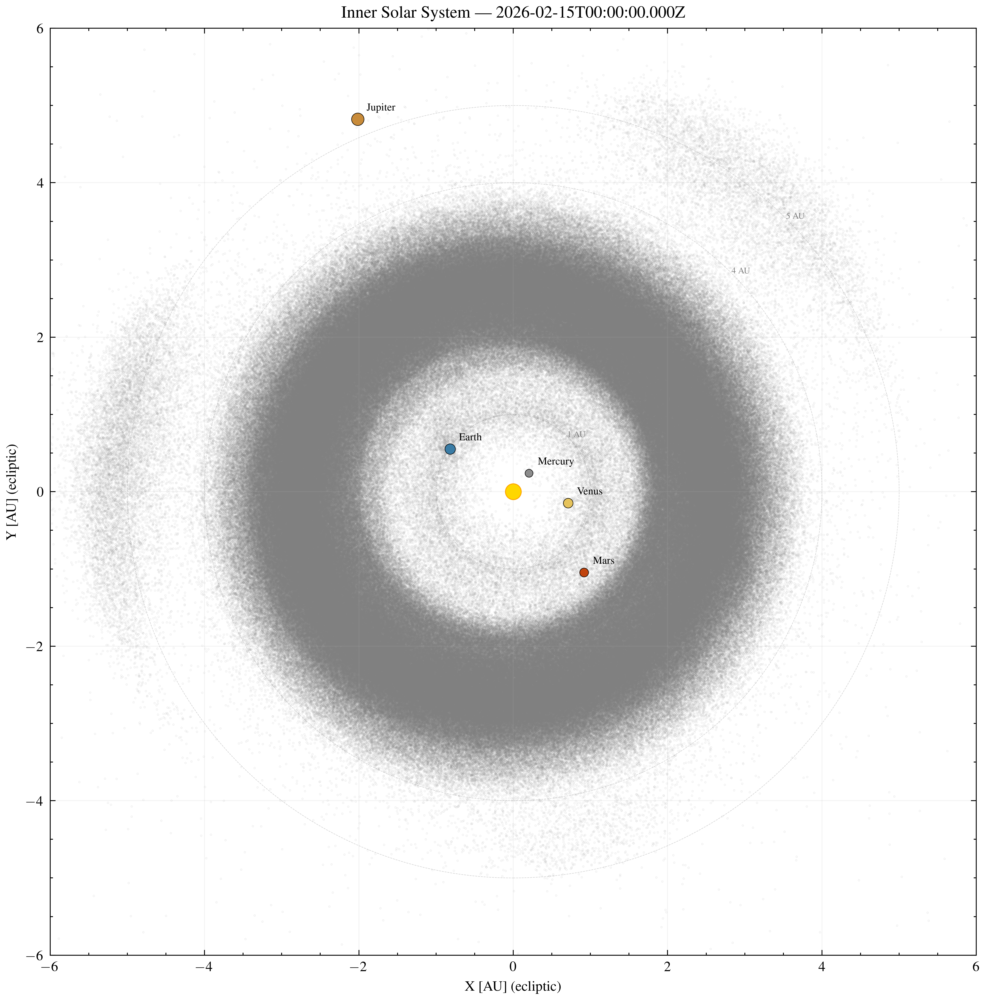

In [7]:
fig, ax = plt.subplots(figsize=(8, 8))

# Asteroids
ax.scatter(ast_x, ast_y, s=0.05, c="grey", alpha=0.15, rasterized=True, zorder=1)

# Sun
ax.scatter(0, 0, s=80, c="gold", edgecolors="orange", linewidths=0.5, zorder=3, label="Sun")

# Planets (inner + Jupiter)
for _pid, name, color, size in PLANETS[:5]:  # Mercury through Jupiter
    x, y, z = planet_positions[name]
    ax.scatter(x, y, s=size, c=color, edgecolors="k", linewidths=0.3, zorder=3)
    ax.annotate(name, (x, y), textcoords="offset points", xytext=(5, 5), fontsize=6)

# Reference orbit circles
for r_au in [1, 2, 3, 4, 5]:
    circle = plt.Circle(
        (0, 0), r_au, fill=False, color="lightgrey", linewidth=0.3, linestyle="--", zorder=0
    )
    ax.add_patch(circle)
    ax.annotate(f"{r_au} AU", (r_au * 0.707, r_au * 0.707), fontsize=5, color="grey", ha="left")

ax.set_xlim(-6, 6)
ax.set_ylim(-6, 6)
ax.set_aspect("equal")
ax.set_xlabel("X [AU] (ecliptic)")
ax.set_ylabel("Y [AU] (ecliptic)")
ax.set_title(f"Inner Solar System — {TARGET_EPOCH}")
ax.grid(True, alpha=0.15)
fig.tight_layout()
plt.show()

## Full Solar System

Zoomed-out view showing all eight planets and distant asteroid populations.

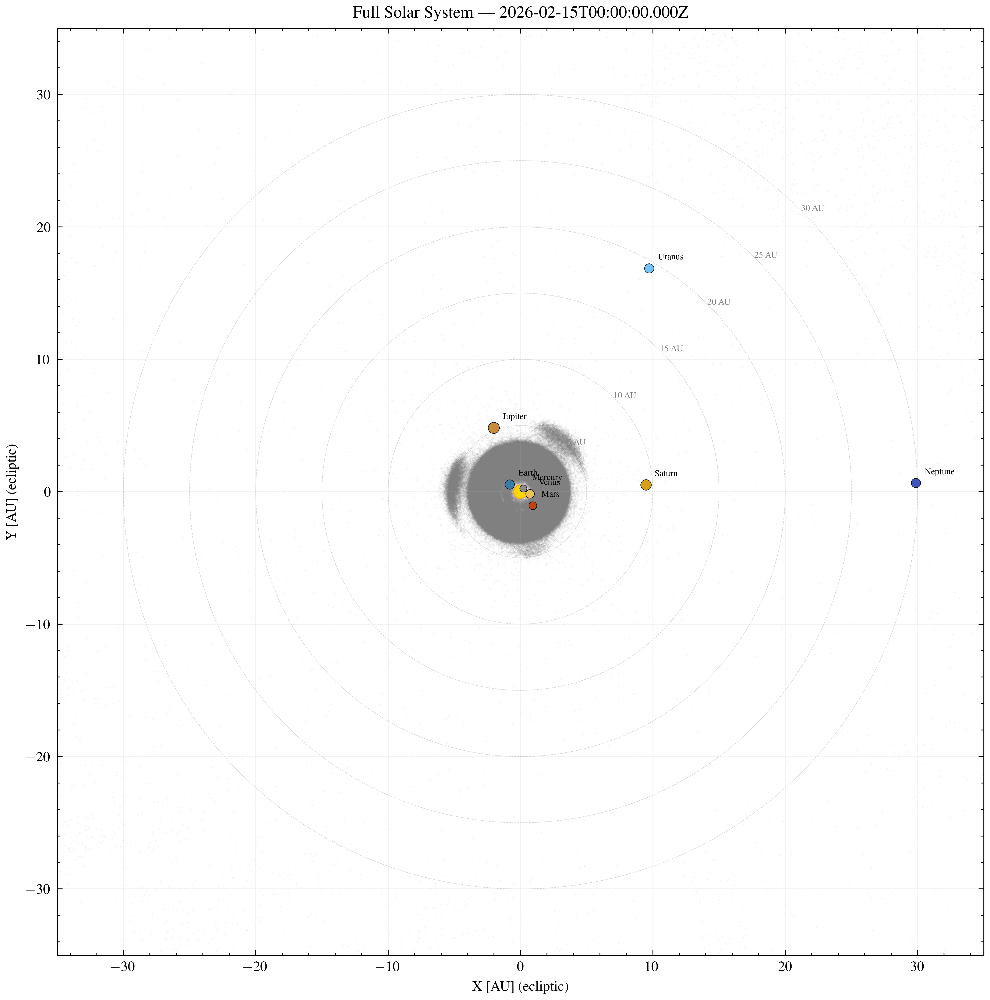

In [8]:
fig, ax = plt.subplots(figsize=(8, 8))

# Asteroids
ax.scatter(ast_x, ast_y, s=0.02, c="grey", alpha=0.1, rasterized=True, zorder=1)

# Sun
ax.scatter(0, 0, s=60, c="gold", edgecolors="orange", linewidths=0.5, zorder=3, label="Sun")

# All planets
for _pid, name, color, size in PLANETS:
    x, y, z = planet_positions[name]
    ax.scatter(x, y, s=size * 0.8, c=color, edgecolors="k", linewidths=0.3, zorder=3)
    ax.annotate(name, (x, y), textcoords="offset points", xytext=(5, 5), fontsize=5)

# Reference orbit circles
for r_au in [5, 10, 15, 20, 25, 30]:
    circle = plt.Circle(
        (0, 0), r_au, fill=False, color="lightgrey", linewidth=0.3, linestyle="--", zorder=0
    )
    ax.add_patch(circle)
    ax.annotate(f"{r_au} AU", (r_au * 0.707, r_au * 0.707), fontsize=5, color="grey", ha="left")

ax.set_xlim(-35, 35)
ax.set_ylim(-35, 35)
ax.set_aspect("equal")
ax.set_xlabel("X [AU] (ecliptic)")
ax.set_ylabel("Y [AU] (ecliptic)")
ax.set_title(f"Full Solar System — {TARGET_EPOCH}")
ax.grid(True, alpha=0.15)
fig.tight_layout()
plt.show()

## Summary Statistics

Asteroid counts by heliocentric distance region.

In [9]:
# Compute heliocentric distances in AU
ast_r = np.sqrt(ast_x**2 + ast_y**2 + np.asarray(states[:, 2]) ** 2)

# Classify by region
n_neo = np.sum(ast_r < 1.3)
n_inner = np.sum((ast_r >= 1.3) & (ast_r < 2.0))
n_main_belt = np.sum((ast_r >= 2.0) & (ast_r < 3.5))
n_outer = np.sum((ast_r >= 3.5) & (ast_r < 5.5))
n_jupiter_trojans = np.sum((ast_r >= 4.5) & (ast_r < 5.8))
n_tno = np.sum(ast_r >= 30.0)

print(f"Total asteroids:     {len(ast_r):>10,}")
print(f"NEOs (< 1.3 AU):     {n_neo:>10,}")
print(f"Inner (1.3-2.0 AU):  {n_inner:>10,}")
print(f"Main belt (2-3.5 AU):{n_main_belt:>10,}")
print(f"Outer (3.5-5.5 AU):  {n_outer:>10,}")
print(f"Jupiter region:      {n_jupiter_trojans:>10,}")
print(f"TNOs (>30 AU):       {n_tno:>10,}")

Total asteroids:      1,518,365
NEOs (< 1.3 AU):         13,006
Inner (1.3-2.0 AU):     101,494
Main belt (2-3.5 AU): 1,300,280
Outer (3.5-5.5 AU):      94,485
Jupiter region:          18,683
TNOs (>30 AU):            5,299
